<a href="https://colab.research.google.com/github/kshero18/Assignments-ML/blob/main/Assignment_2_AML_(DCM).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pydicom
!pip install gdcm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 18.8 MB/s eta 0:00:00


In [2]:
!pip install kaggle


In [3]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ksheerajaks","key":"2c0214db0154fff312692c92a6cedfc6"}'}

In [4]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [5]:
!kaggle competitions download -c rsna-2024-lumbar-spine-degenerative-classification


100% 28.2G/28.2G [05:53<00:00, 54.0MB/s]
100% 28.2G/28.2G [05:53<00:00, 85.7MB/s]


In [6]:
!unzip rsna-2024-lumbar-spine-degenerative-classification.zip


Streaming output truncated to the last 5000 lines.
  inflating: train_images/885894528/2509467535/43.dcm  
  inflating: train_images/885894528/2509467535/44.dcm  
  inflating: train_images/885894528/2509467535/45.dcm  
  inflating: train_images/885894528/2509467535/46.dcm  
  inflating: train_images/885894528/2509467535/47.dcm  
  inflating: train_images/885894528/2509467535/48.dcm  
  inflating: train_images/885894528/2509467535/49.dcm  
  inflating: train_images/885894528/2509467535/5.dcm  
  inflating: train_images/885894528/2509467535/50.dcm  
  inflating: train_images/885894528/2509467535/6.dcm  
  inflating: train_images/885894528/2509467535/7.dcm  
  inflating: train_images/885894528/2509467535/8.dcm  
  inflating: train_images/885894528/2509467535/9.dcm  
  inflating: train_images/885894528/3303042519/1.dcm  
  inflating: train_images/885894528/3303042519/10.dcm  
  inflating: train_images/885894528/3303042519/11.dcm  
  inflating: train_images/885894528/3303042519/12.dcm  
  i

Loading and EDA


In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image

# Load the CSV file (assuming it exists in the dataset)
labels_df = pd.read_csv('/content/train.csv')

# Display basic information and first few rows
print(labels_df.tail().info())
labels_df.tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 1970 to 1974
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   study_id                                5 non-null      int64 
 1   spinal_canal_stenosis_l1_l2             5 non-null      object
 2   spinal_canal_stenosis_l2_l3             5 non-null      object
 3   spinal_canal_stenosis_l3_l4             5 non-null      object
 4   spinal_canal_stenosis_l4_l5             5 non-null      object
 5   spinal_canal_stenosis_l5_s1             5 non-null      object
 6   left_neural_foraminal_narrowing_l1_l2   5 non-null      object
 7   left_neural_foraminal_narrowing_l2_l3   5 non-null      object
 8   left_neural_foraminal_narrowing_l3_l4   5 non-null      object
 9   left_neural_foraminal_narrowing_l4_l5   5 non-null      object
 10  left_neural_foraminal_narrowing_l5_s1   5 non-null      object
 11  righ

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
1970,4282019580,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate
1971,4283570761,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1972,4284048608,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild
1973,4287160193,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Severe,Moderate,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Moderate,Normal/Mild
1974,4290709089,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild


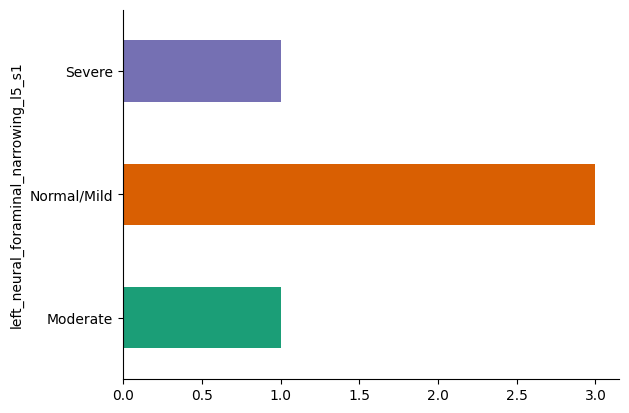

In [53]:
from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('left_neural_foraminal_narrowing_l5_s1').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [54]:

# Check for null values in each column
null_counts = labels_df.isnull().sum()

# Display the columns with their respective count of null values
print(null_counts[null_counts > 0])

spinal_canal_stenosis_l1_l2                 1
spinal_canal_stenosis_l2_l3                 1
spinal_canal_stenosis_l3_l4                 1
spinal_canal_stenosis_l4_l5                 1
spinal_canal_stenosis_l5_s1                 1
left_neural_foraminal_narrowing_l1_l2       2
left_neural_foraminal_narrowing_l2_l3       2
left_neural_foraminal_narrowing_l3_l4       2
left_neural_foraminal_narrowing_l4_l5       2
left_neural_foraminal_narrowing_l5_s1       2
right_neural_foraminal_narrowing_l1_l2      8
right_neural_foraminal_narrowing_l2_l3      8
right_neural_foraminal_narrowing_l3_l4      8
right_neural_foraminal_narrowing_l4_l5      8
right_neural_foraminal_narrowing_l5_s1      8
left_subarticular_stenosis_l1_l2          164
left_subarticular_stenosis_l2_l3           82
left_subarticular_stenosis_l3_l4            3
left_subarticular_stenosis_l4_l5            3
left_subarticular_stenosis_l5_s1           11
right_subarticular_stenosis_l1_l2         161
right_subarticular_stenosis_l2_l3 

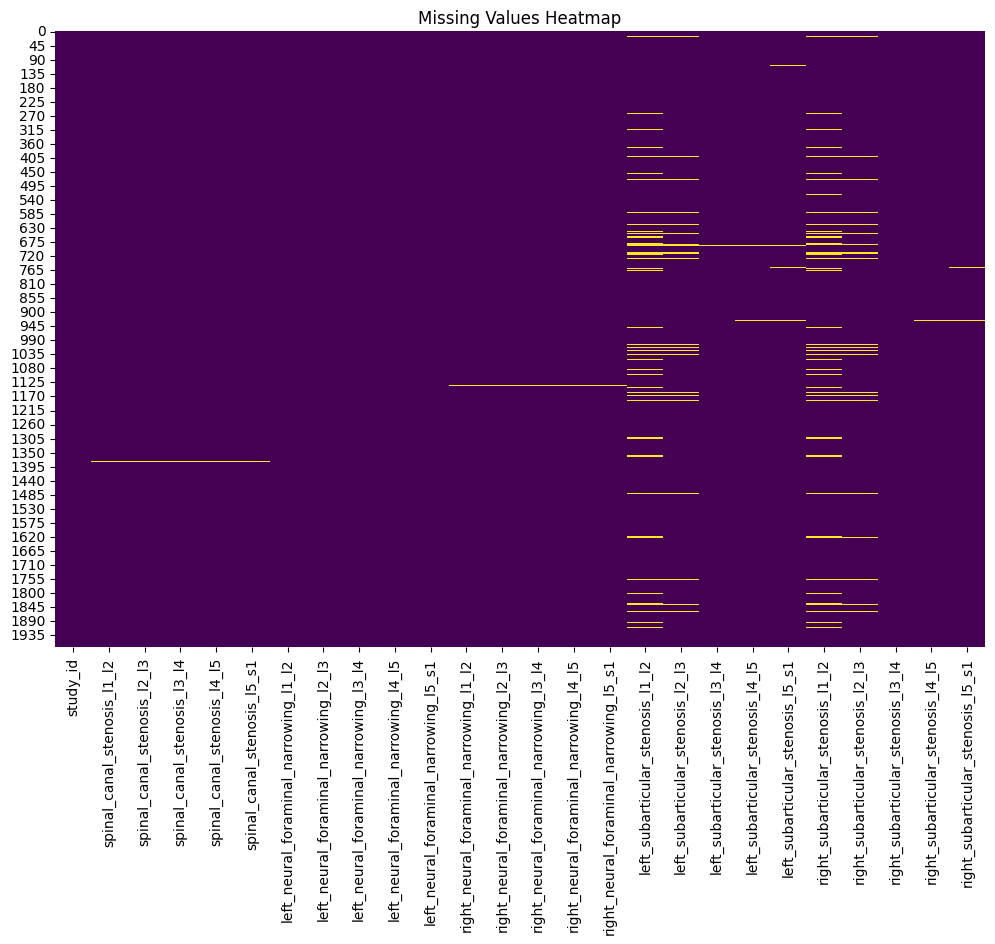

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the null values with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(labels_df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

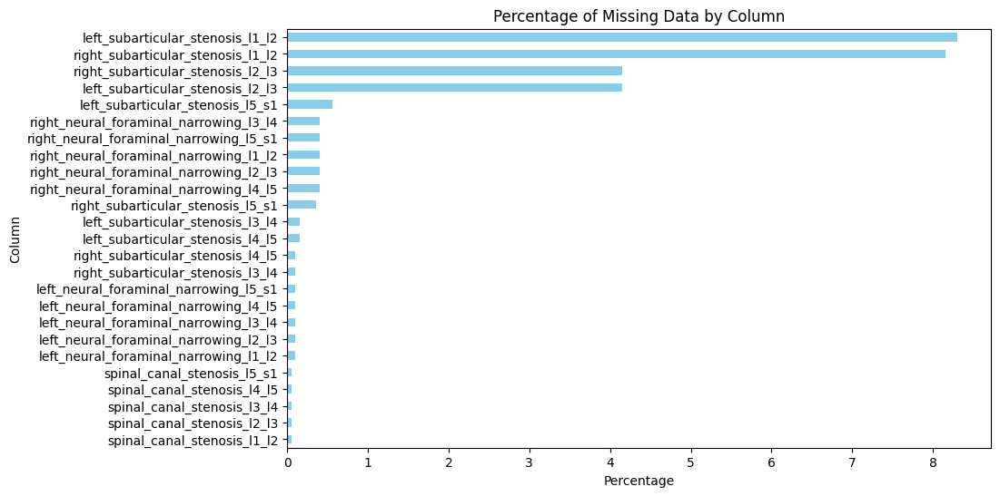

In [56]:
# Calculate the percentage of missing values for each column
missing_percentage = (labels_df.isnull().sum() / len(labels_df)) * 100

# Filter columns with missing values
missing_percentage = missing_percentage[missing_percentage > 0]

# Plot the missing data
plt.figure(figsize=(10, 6))
missing_percentage.sort_values().plot(kind='barh', color='skyblue')
plt.title('Percentage of Missing Data by Column')
plt.xlabel('Percentage')
plt.ylabel('Column')
plt.show()

Total DICOM files found: 60
Displaying DICOM file: /content/train_images/100206310/1012284084/44.dcm


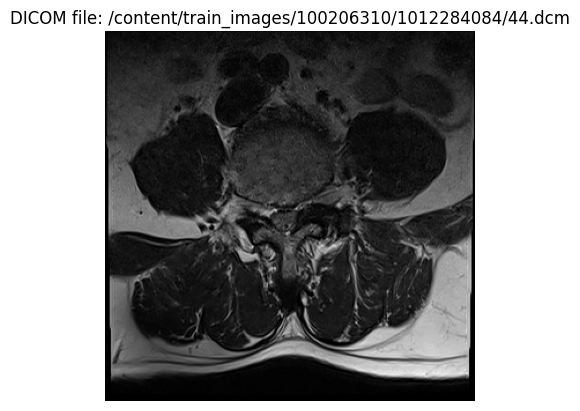

Displaying DICOM file: /content/train_images/100206310/1012284084/11.dcm


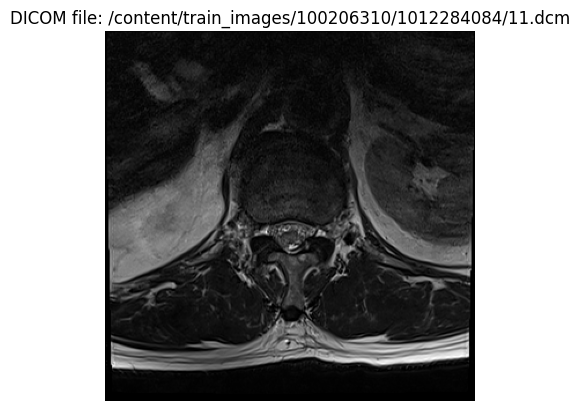

Displaying DICOM file: /content/train_images/100206310/1012284084/19.dcm


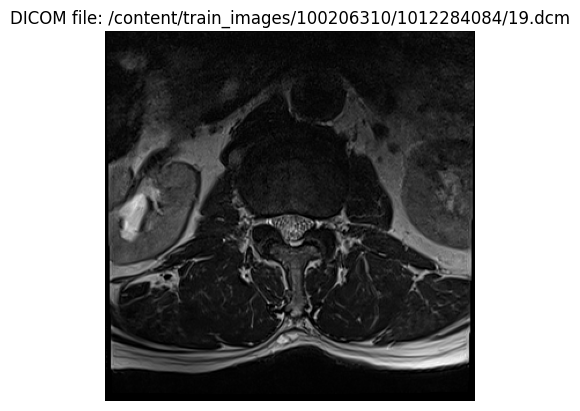

Displaying DICOM file: /content/train_images/100206310/1012284084/6.dcm


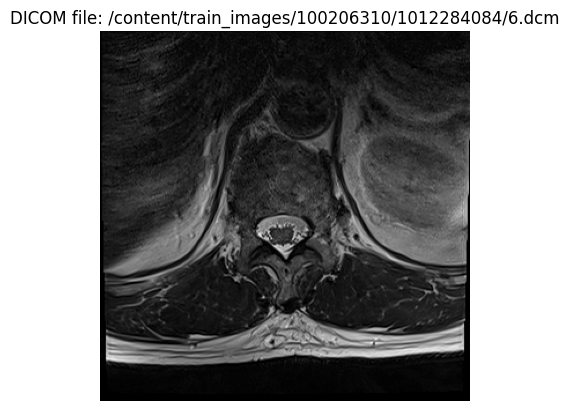

Displaying DICOM file: /content/train_images/100206310/1012284084/30.dcm


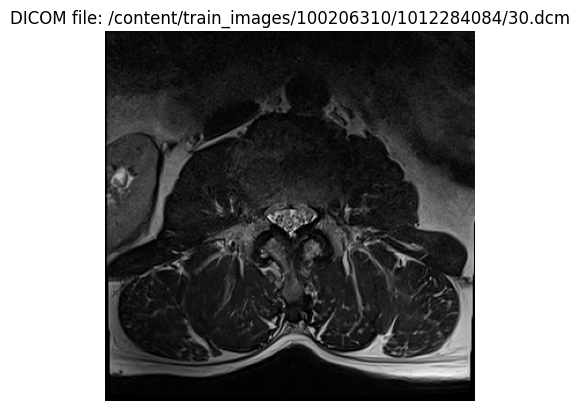

Displaying DICOM file: /content/train_images/100206310/1012284084/37.dcm


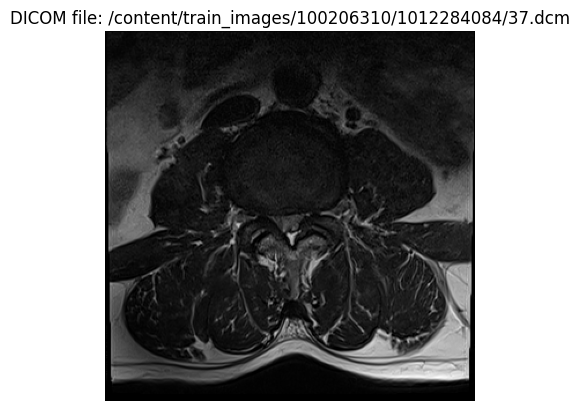

Displaying DICOM file: /content/train_images/100206310/1012284084/40.dcm


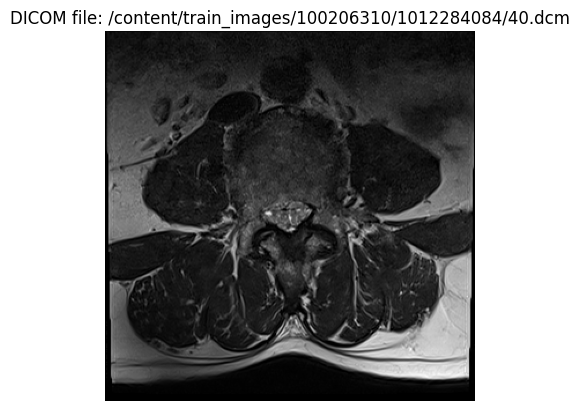

Displaying DICOM file: /content/train_images/100206310/1012284084/58.dcm


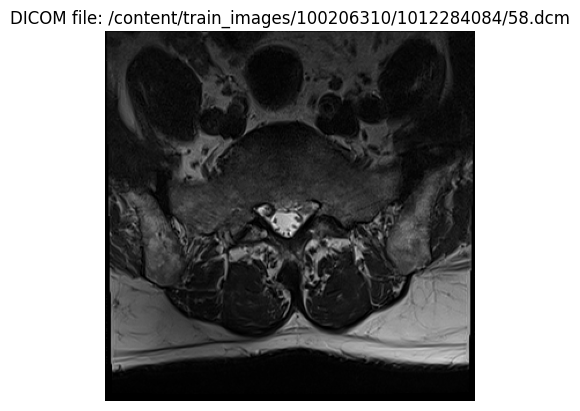

Displaying DICOM file: /content/train_images/100206310/1012284084/4.dcm


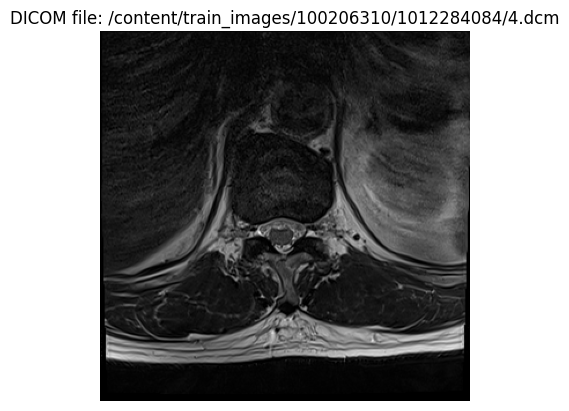

Displaying DICOM file: /content/train_images/100206310/1012284084/38.dcm


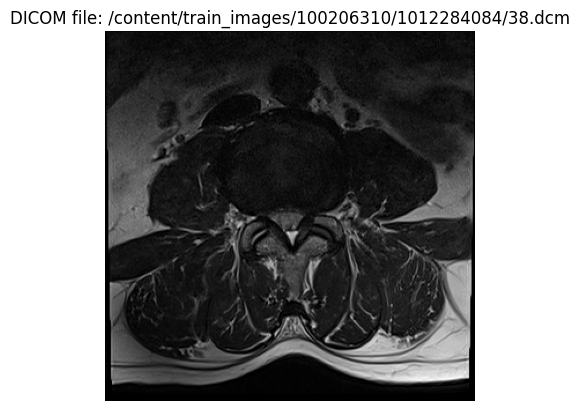

Displaying DICOM file: /content/train_images/100206310/1012284084/3.dcm


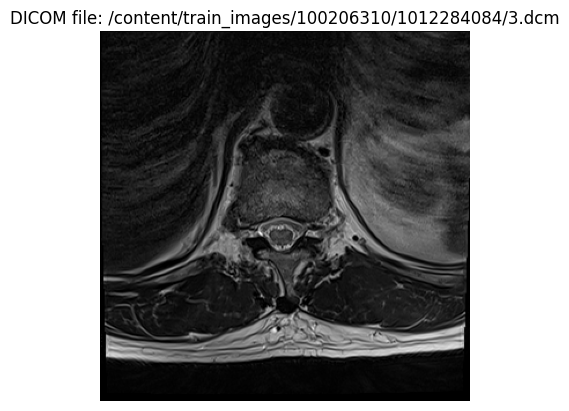

Displaying DICOM file: /content/train_images/100206310/1012284084/32.dcm


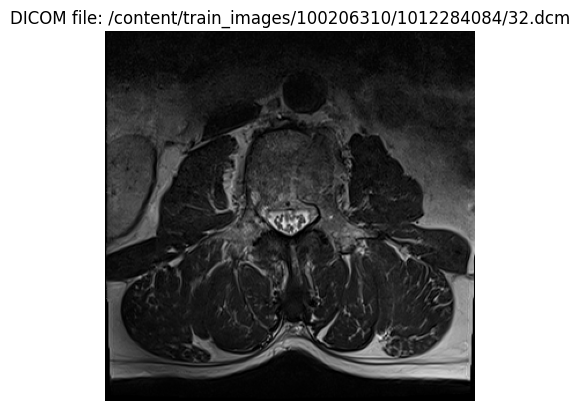

Displaying DICOM file: /content/train_images/100206310/1012284084/15.dcm


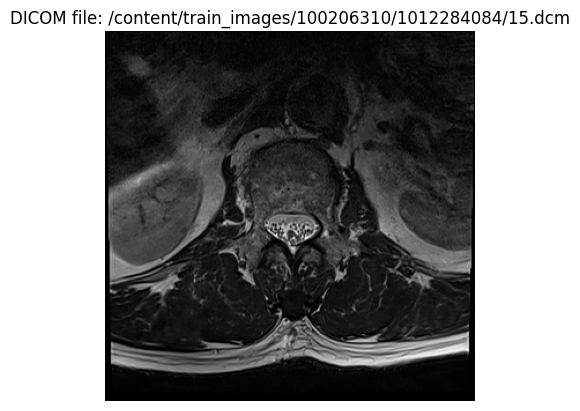

Displaying DICOM file: /content/train_images/100206310/1012284084/23.dcm


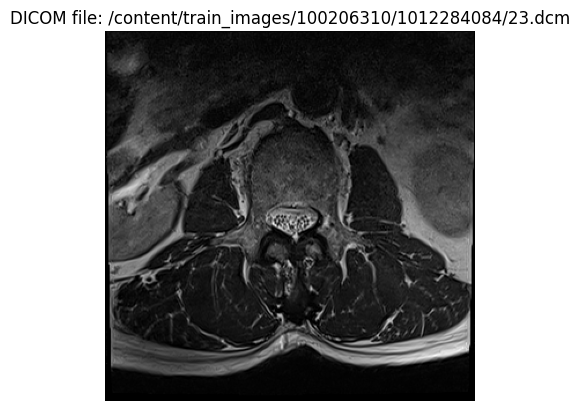

Displaying DICOM file: /content/train_images/100206310/1012284084/48.dcm


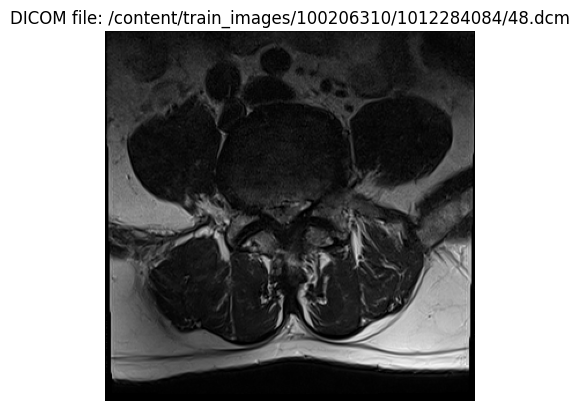

Displaying DICOM file: /content/train_images/100206310/1012284084/22.dcm


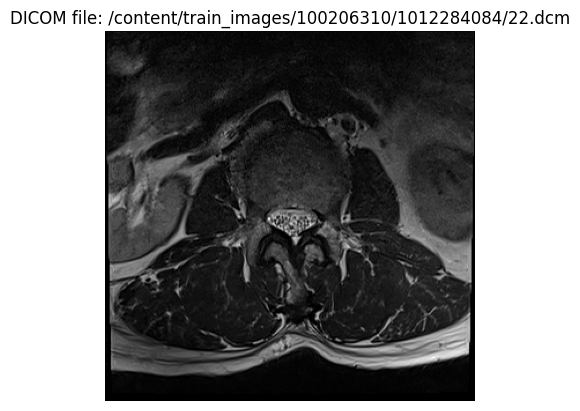

Displaying DICOM file: /content/train_images/100206310/1012284084/24.dcm


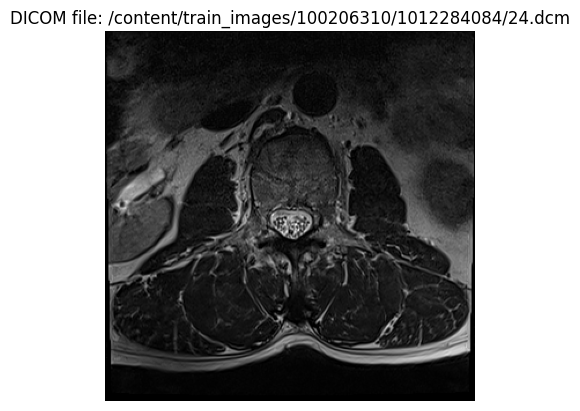

Displaying DICOM file: /content/train_images/100206310/1012284084/50.dcm


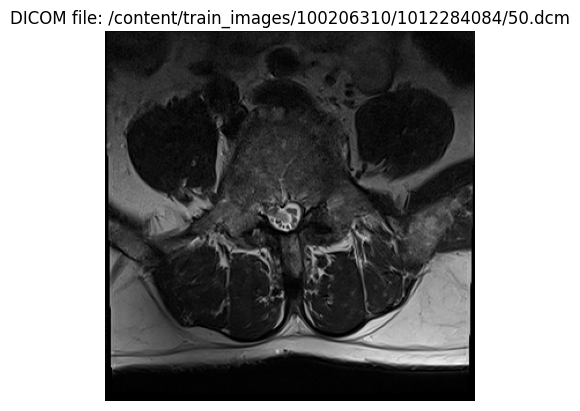

Displaying DICOM file: /content/train_images/100206310/1012284084/31.dcm


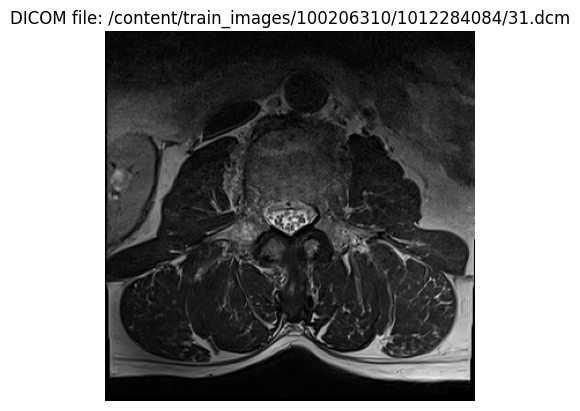

Displaying DICOM file: /content/train_images/100206310/1012284084/46.dcm


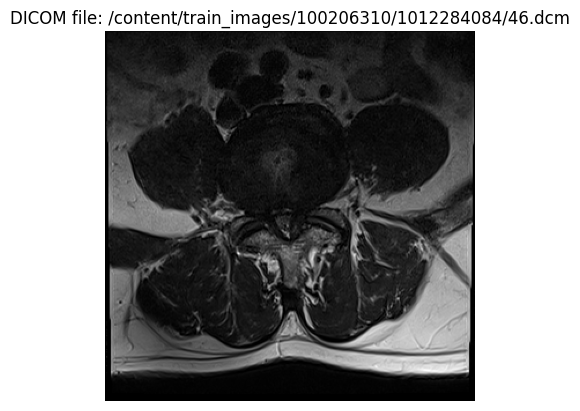

Displaying DICOM file: /content/train_images/100206310/1012284084/36.dcm


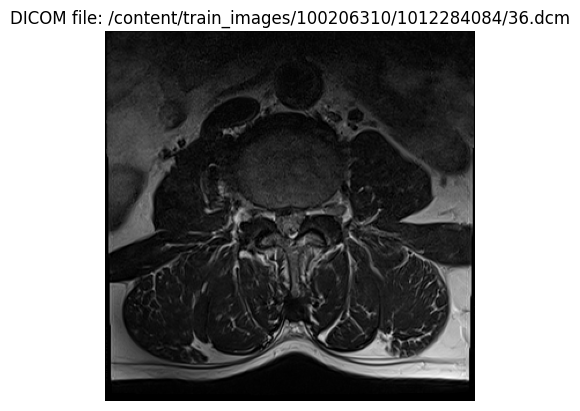

Displaying DICOM file: /content/train_images/100206310/1012284084/16.dcm


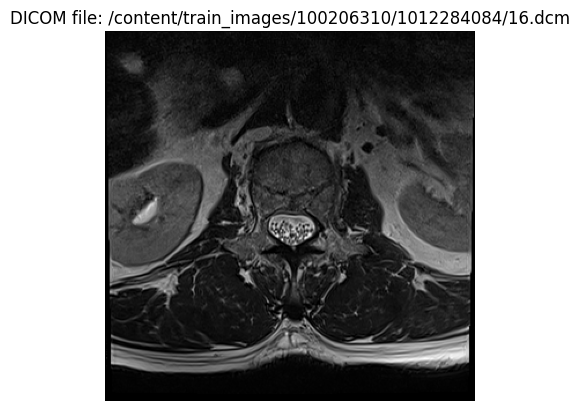

Displaying DICOM file: /content/train_images/100206310/1012284084/59.dcm


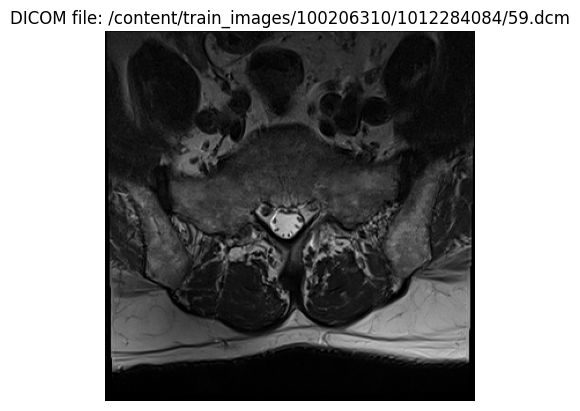

Displaying DICOM file: /content/train_images/100206310/1012284084/7.dcm


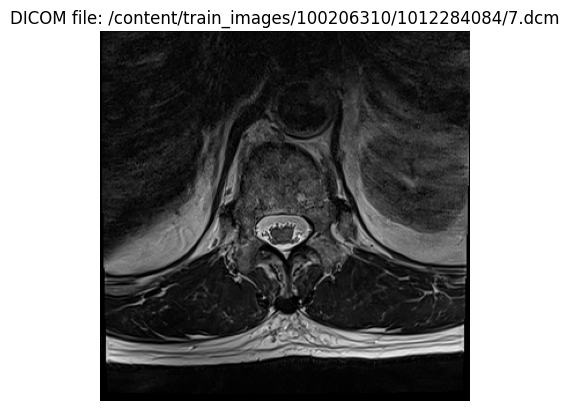

Displaying DICOM file: /content/train_images/100206310/1012284084/52.dcm


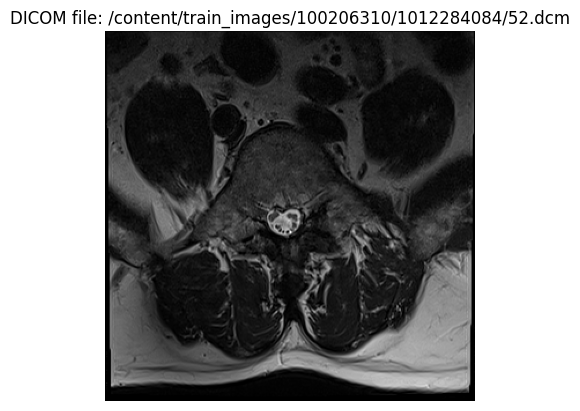

Displaying DICOM file: /content/train_images/100206310/1012284084/51.dcm


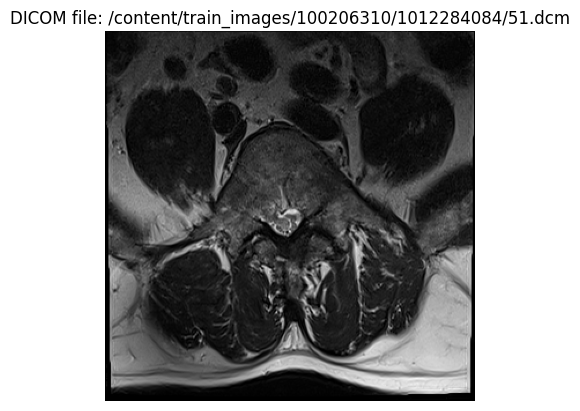

Displaying DICOM file: /content/train_images/100206310/1012284084/21.dcm


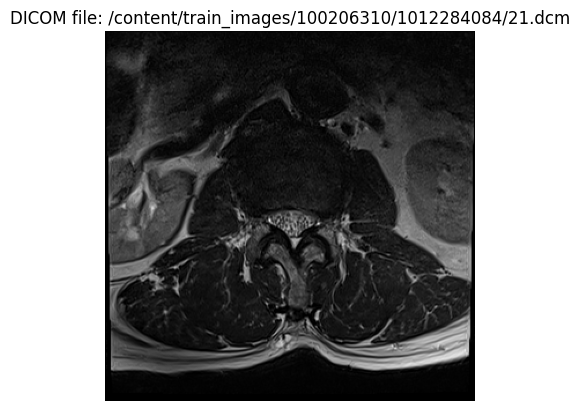

Displaying DICOM file: /content/train_images/100206310/1012284084/5.dcm


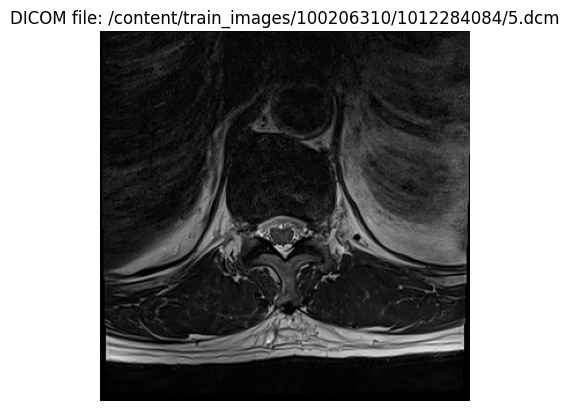

Displaying DICOM file: /content/train_images/100206310/1012284084/35.dcm


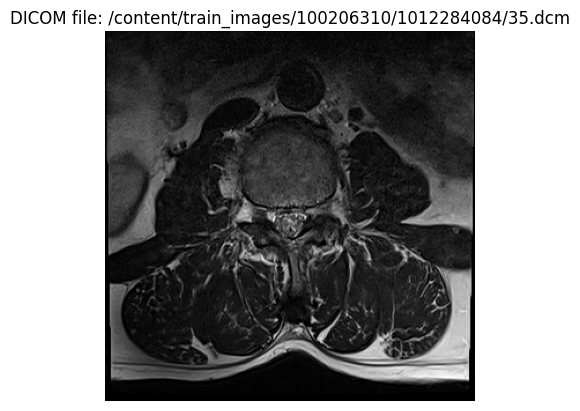

Displaying DICOM file: /content/train_images/100206310/1012284084/41.dcm


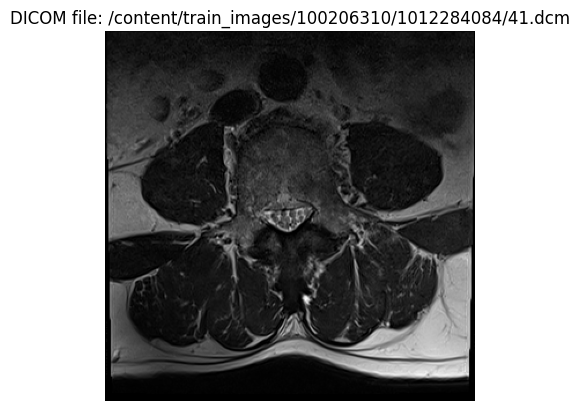

Displaying DICOM file: /content/train_images/100206310/1012284084/28.dcm


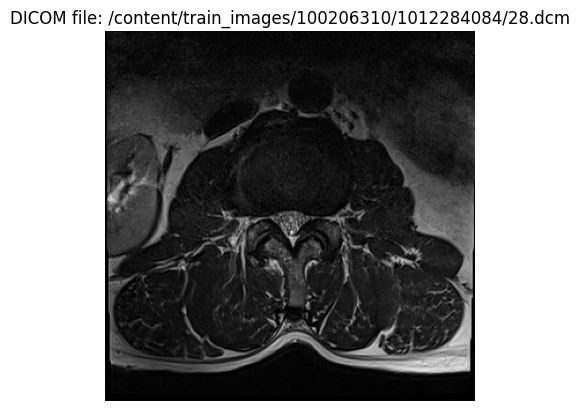

Displaying DICOM file: /content/train_images/100206310/1012284084/29.dcm


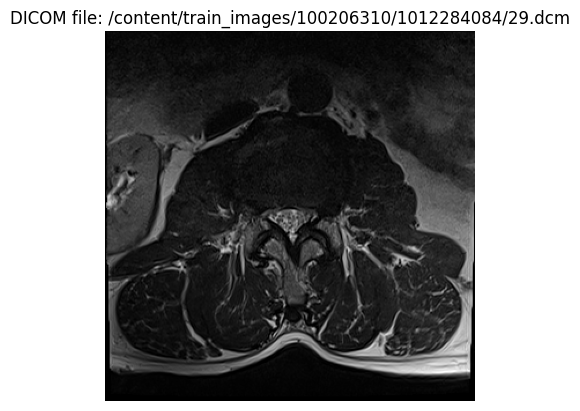

Displaying DICOM file: /content/train_images/100206310/1012284084/43.dcm


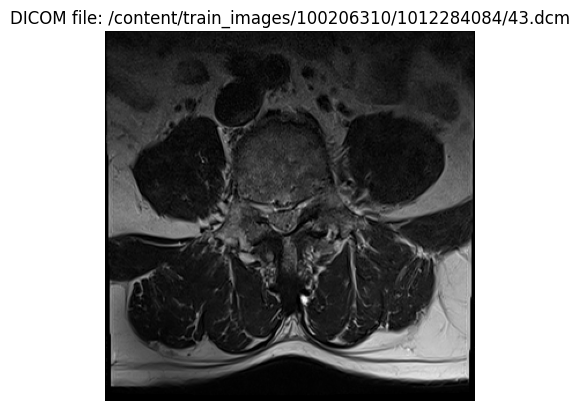

Displaying DICOM file: /content/train_images/100206310/1012284084/17.dcm


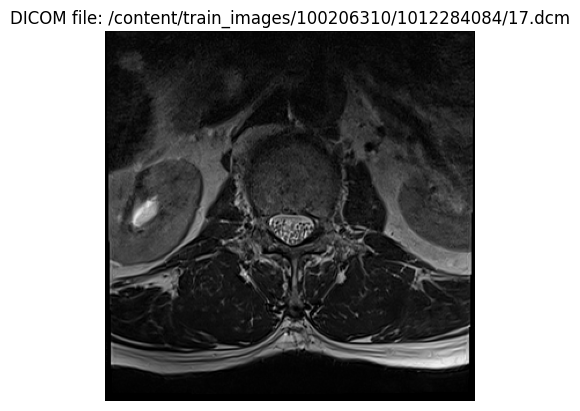

Displaying DICOM file: /content/train_images/100206310/1012284084/53.dcm


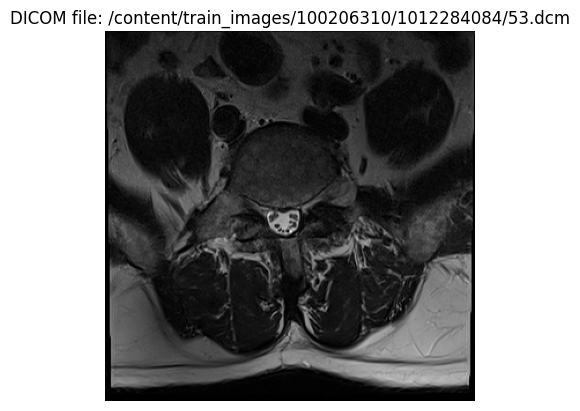

Displaying DICOM file: /content/train_images/100206310/1012284084/60.dcm


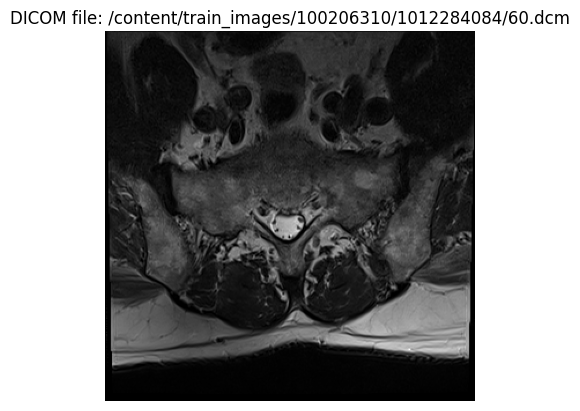

Displaying DICOM file: /content/train_images/100206310/1012284084/45.dcm


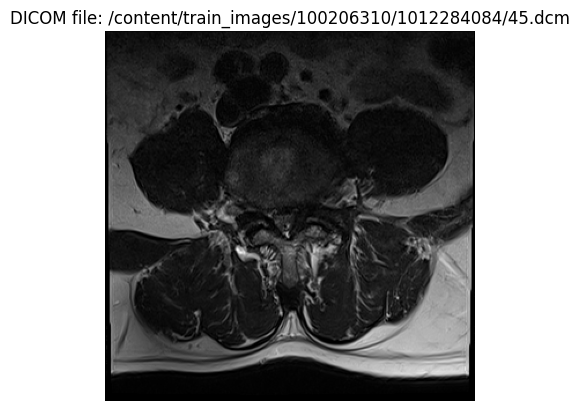

Displaying DICOM file: /content/train_images/100206310/1012284084/55.dcm


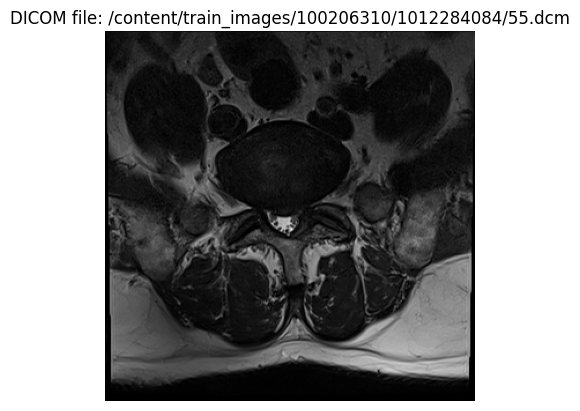

Displaying DICOM file: /content/train_images/100206310/1012284084/27.dcm


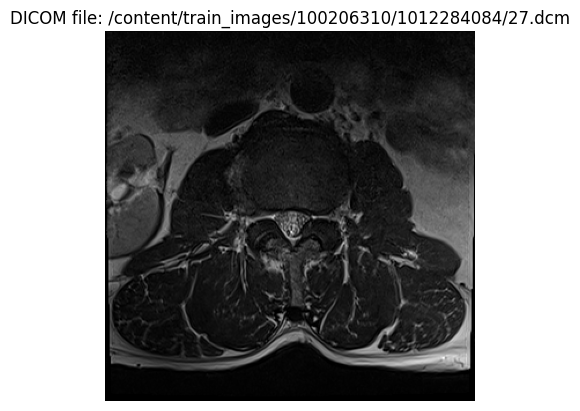

Displaying DICOM file: /content/train_images/100206310/1012284084/9.dcm


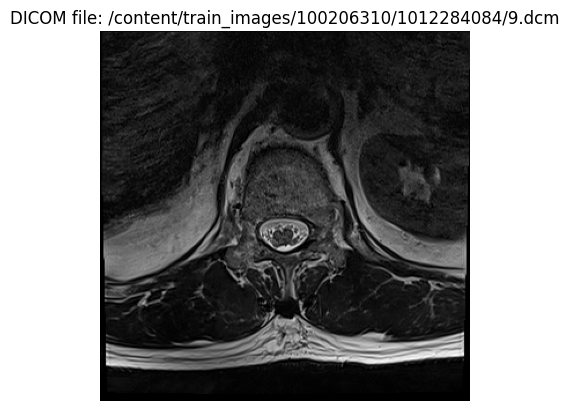

Displaying DICOM file: /content/train_images/100206310/1012284084/8.dcm


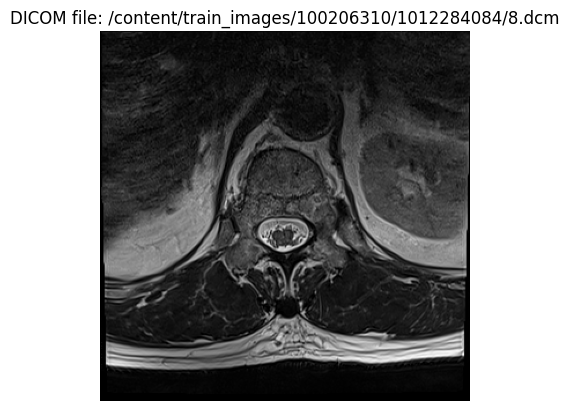

Displaying DICOM file: /content/train_images/100206310/1012284084/33.dcm


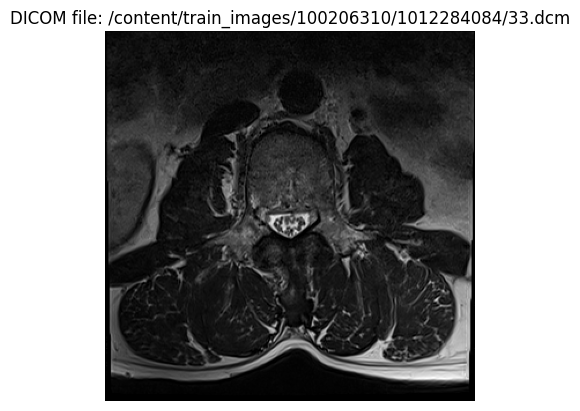

Displaying DICOM file: /content/train_images/100206310/1012284084/20.dcm


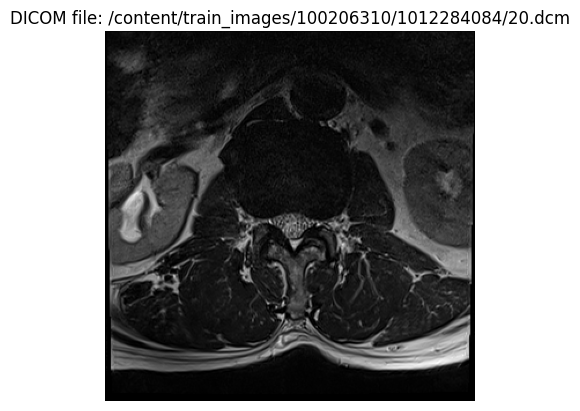

Displaying DICOM file: /content/train_images/100206310/1012284084/12.dcm


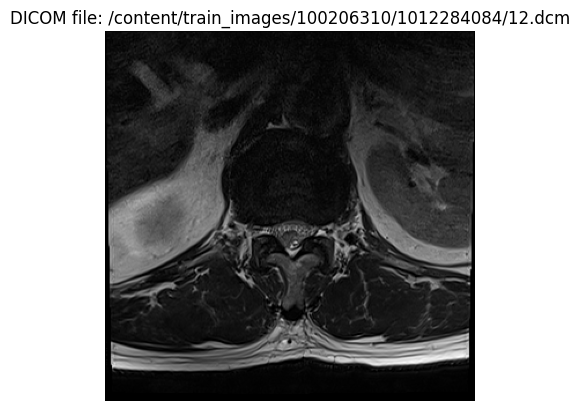

Displaying DICOM file: /content/train_images/100206310/1012284084/49.dcm


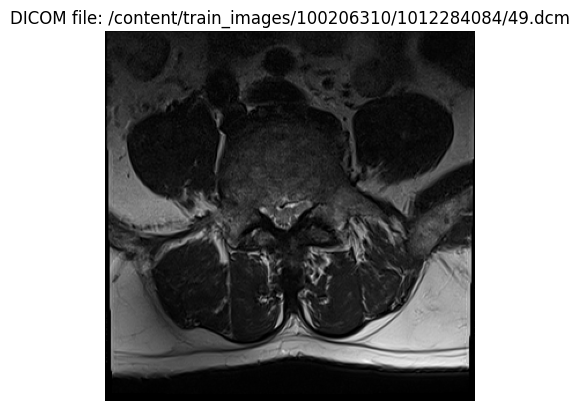

Displaying DICOM file: /content/train_images/100206310/1012284084/47.dcm


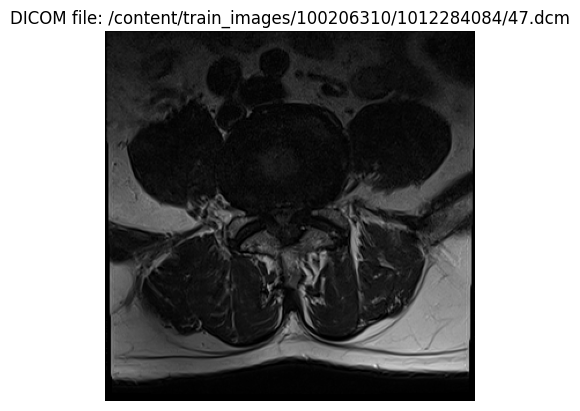

Displaying DICOM file: /content/train_images/100206310/1012284084/42.dcm


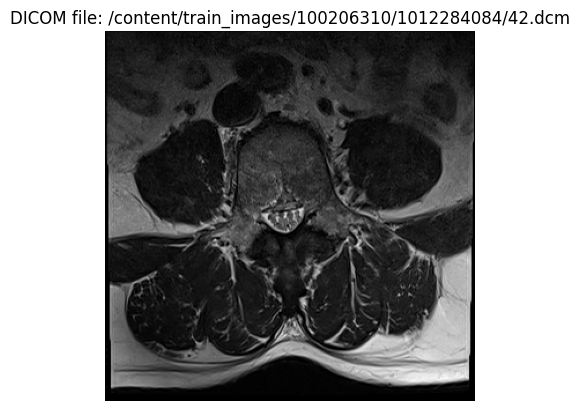

Displaying DICOM file: /content/train_images/100206310/1012284084/34.dcm


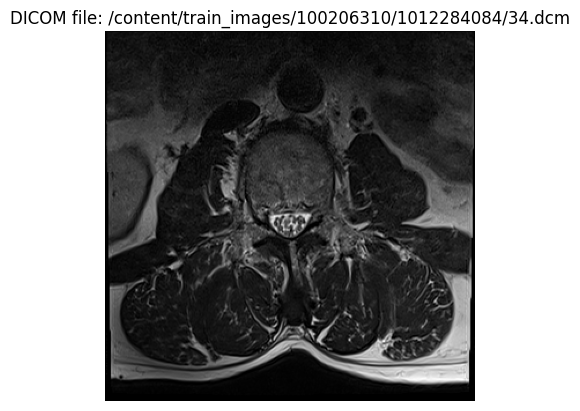

Displaying DICOM file: /content/train_images/100206310/1012284084/2.dcm


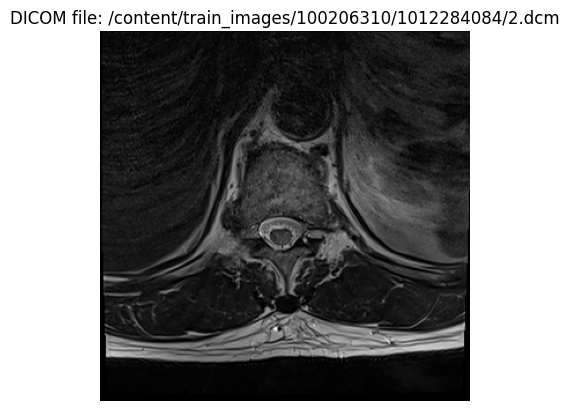

Displaying DICOM file: /content/train_images/100206310/1012284084/56.dcm


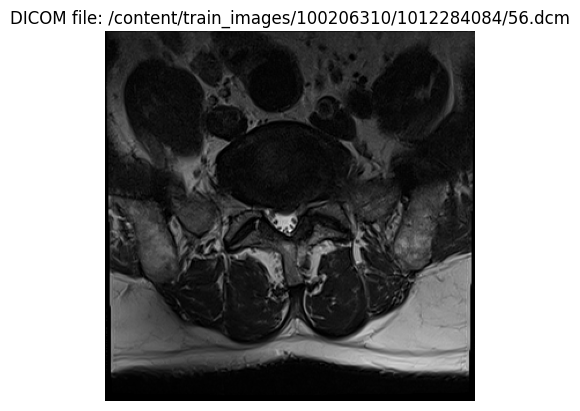

Displaying DICOM file: /content/train_images/100206310/1012284084/25.dcm


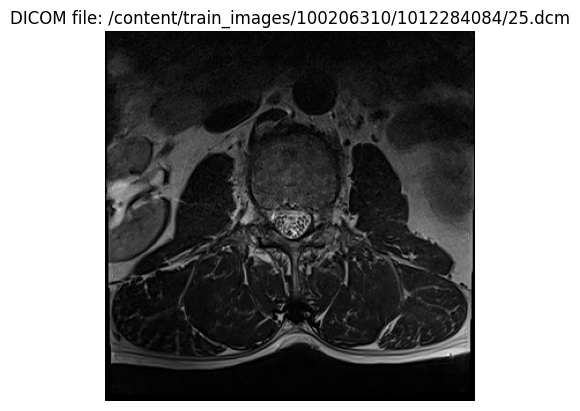

Displaying DICOM file: /content/train_images/100206310/1012284084/39.dcm


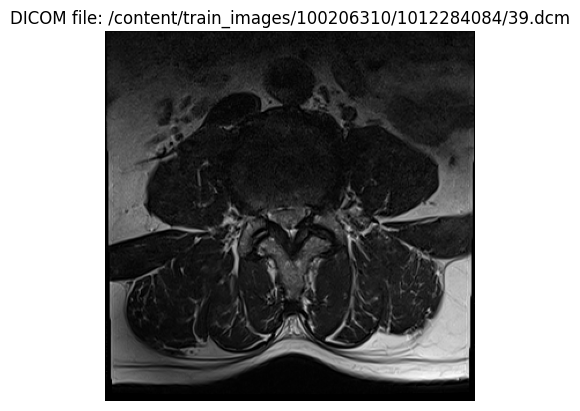

Displaying DICOM file: /content/train_images/100206310/1012284084/14.dcm


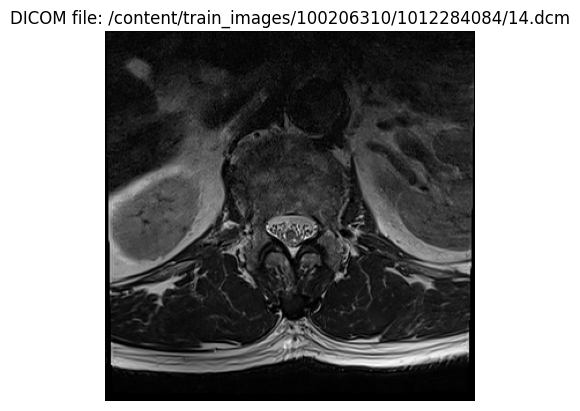

Displaying DICOM file: /content/train_images/100206310/1012284084/26.dcm


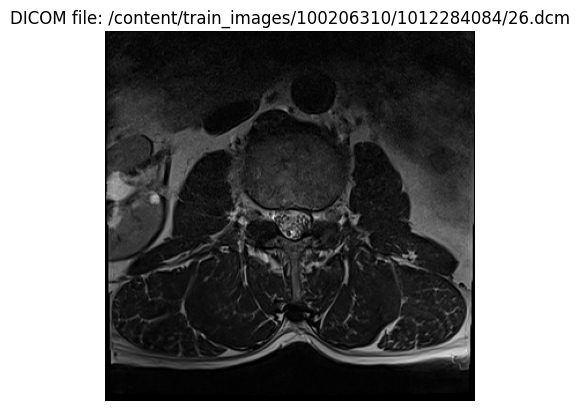

Displaying DICOM file: /content/train_images/100206310/1012284084/57.dcm


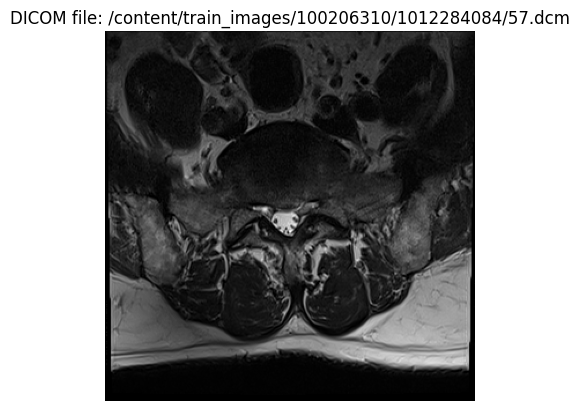

Displaying DICOM file: /content/train_images/100206310/1012284084/13.dcm


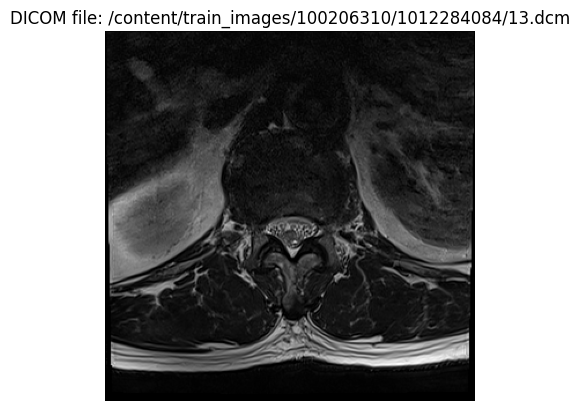

Displaying DICOM file: /content/train_images/100206310/1012284084/54.dcm


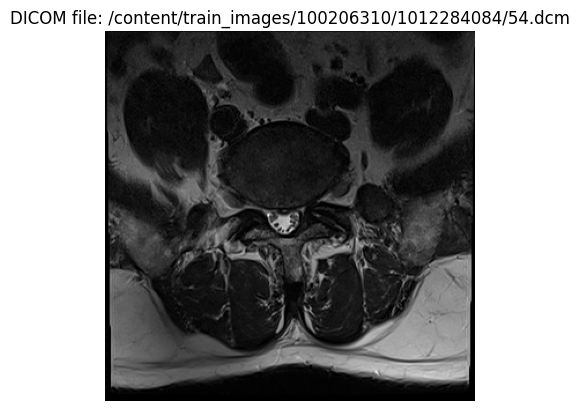

Displaying DICOM file: /content/train_images/100206310/1012284084/18.dcm


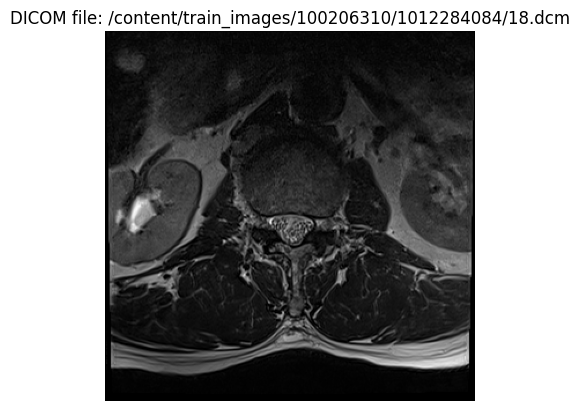

Displaying DICOM file: /content/train_images/100206310/1012284084/1.dcm


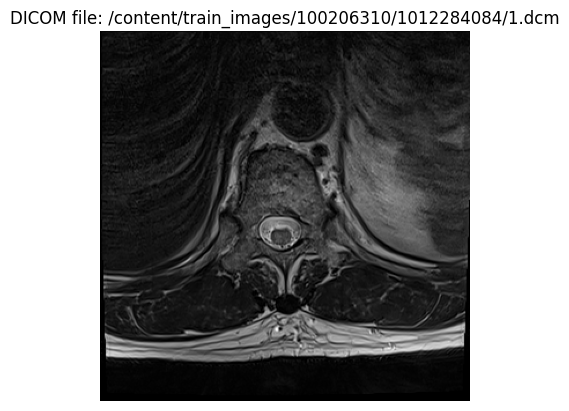

Displaying DICOM file: /content/train_images/100206310/1012284084/10.dcm


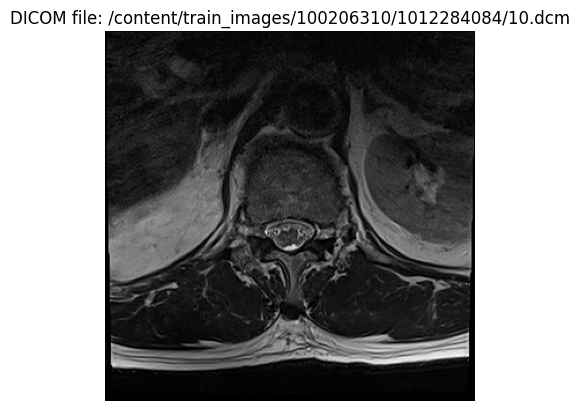

In [57]:
import os
import matplotlib.pyplot as plt
import pydicom

# Path to the DICOM files folder (update this path according to your dataset structure)
dcm_folder = '/content/train_images/100206310/1012284084'

# List all DICOM files
dcm_files = []
for dirname, _, filenames in os.walk(dcm_folder):
    for filename in filenames:
        if filename.endswith('.dcm'):
            full_path = os.path.join(dirname, filename)
            # print(f"Found DICOM file: {full_path}")  # Debugging print
            dcm_files.append(full_path)

# Check if files are found
if not dcm_files:
    print("No DICOM files found in the specified directory.")
else:
    print(f"Total DICOM files found: {len(dcm_files)}")

# List to store the DICOM data
dicom_data_list = []

# Assuming dcm_files is a list of file paths
for dicom_file in dcm_files:
    try:
        dicom_data = pydicom.dcmread(dicom_file)
        if hasattr(dicom_data, 'pixel_array'):
            dicom_data_list.append((dicom_file, dicom_data))
            # print(f"Successfully read DICOM file: {dicom_file}")  # Debugging print
        else:
            print(f"No pixel data in DICOM file: {dicom_file}")  # Debugging print
    except Exception as e:
        print(f"Error reading {dicom_file}: {e}")

# Display the images and print the file path
for dicom_file, dicom_data in dicom_data_list:
    try:
        print(f"Displaying DICOM file: {dicom_file}")
        plt.imshow(dicom_data.pixel_array, cmap=plt.cm.gray)
        plt.title(f"DICOM file: {dicom_file}")
        plt.axis('off')  # Hide axis labels
        plt.show()
    except AttributeError:
        print(f"No pixel data found for {dicom_file}.")


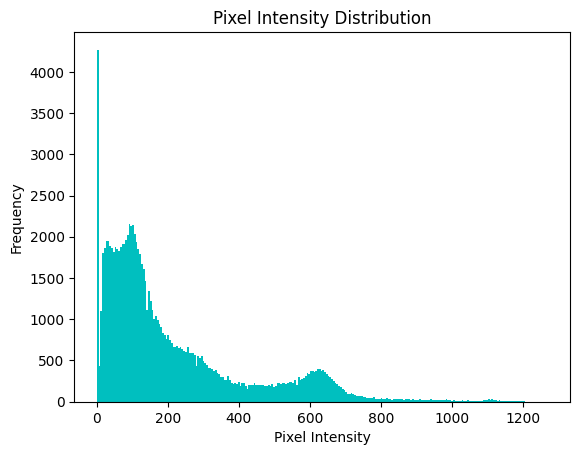

In [58]:
import numpy as np
pixel_data = dicom_data.pixel_array
plt.hist(pixel_data.ravel(), bins=256, color='c')
plt.title('Pixel Intensity Distribution')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()


Index(['study_id', 'spinal_canal_stenosis_l1_l2',
       'spinal_canal_stenosis_l2_l3', 'spinal_canal_stenosis_l3_l4',
       'spinal_canal_stenosis_l4_l5', 'spinal_canal_stenosis_l5_s1',
       'left_neural_foraminal_narrowing_l1_l2',
       'left_neural_foraminal_narrowing_l2_l3',
       'left_neural_foraminal_narrowing_l3_l4',
       'left_neural_foraminal_narrowing_l4_l5',
       'left_neural_foraminal_narrowing_l5_s1',
       'right_neural_foraminal_narrowing_l1_l2',
       'right_neural_foraminal_narrowing_l2_l3',
       'right_neural_foraminal_narrowing_l3_l4',
       'right_neural_foraminal_narrowing_l4_l5',
       'right_neural_foraminal_narrowing_l5_s1',
       'left_subarticular_stenosis_l1_l2', 'left_subarticular_stenosis_l2_l3',
       'left_subarticular_stenosis_l3_l4', 'left_subarticular_stenosis_l4_l5',
       'left_subarticular_stenosis_l5_s1', 'right_subarticular_stenosis_l1_l2',
       'right_subarticular_stenosis_l2_l3',
       'right_subarticular_stenosis_l3_l4',
 

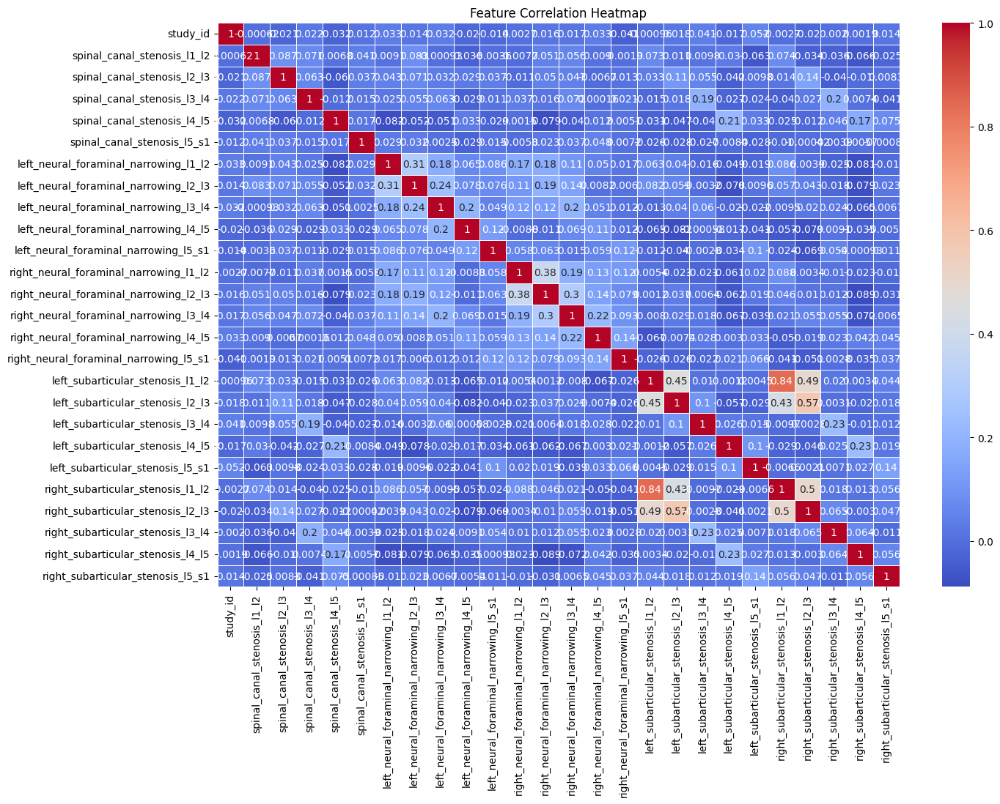

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Load the CSV file (replace with the actual path)
labels_df = pd.read_csv('/content/train.csv')

# Display the column names in the dataset
print(labels_df.columns)

from sklearn.preprocessing import LabelEncoder

# Identify the columns that need encoding (columns with string data)
categorical_columns = [
    'spinal_canal_stenosis_l1_l2', 'spinal_canal_stenosis_l2_l3',
    'spinal_canal_stenosis_l3_l4', 'spinal_canal_stenosis_l4_l5',
    'spinal_canal_stenosis_l5_s1', 'left_neural_foraminal_narrowing_l1_l2',
    'left_neural_foraminal_narrowing_l2_l3', 'left_neural_foraminal_narrowing_l3_l4',
    'left_neural_foraminal_narrowing_l4_l5', 'left_neural_foraminal_narrowing_l5_s1',
    'right_neural_foraminal_narrowing_l1_l2', 'right_neural_foraminal_narrowing_l2_l3',
    'right_neural_foraminal_narrowing_l3_l4', 'right_neural_foraminal_narrowing_l4_l5',
    'right_neural_foraminal_narrowing_l5_s1', 'left_subarticular_stenosis_l1_l2',
    'left_subarticular_stenosis_l2_l3', 'left_subarticular_stenosis_l3_l4',
    'left_subarticular_stenosis_l4_l5', 'left_subarticular_stenosis_l5_s1',
    'right_subarticular_stenosis_l1_l2', 'right_subarticular_stenosis_l2_l3',
    'right_subarticular_stenosis_l3_l4', 'right_subarticular_stenosis_l4_l5',
    'right_subarticular_stenosis_l5_s1'
]

# Apply label encoding to each of the categorical columns
label_encoder = LabelEncoder()

for col in categorical_columns:
    labels_df[col] = label_encoder.fit_transform(labels_df[col])

# Compute the correlation matrix after encoding
correlation_matrix = labels_df.corr()

# Create the heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Feature Correlation Heatmap')
plt.show()


In [60]:
# Handling missing values (if applicable)
print(labels_df.isnull().sum())
labels_df.fillna(labels_df.median(), inplace=True)
print(labels_df.isnull().sum())

# Identifying outliers (example using IQR)
Q1 = labels_df.quantile(0.25)
Q3 = labels_df.quantile(0.75)
IQR = Q3 - Q1
outliers = labels_df[(labels_df < (Q1 - 1.5 * IQR)) | (labels_df > (Q3 + 1.5 * IQR))]
outliers

study_id                                  0
spinal_canal_stenosis_l1_l2               0
spinal_canal_stenosis_l2_l3               0
spinal_canal_stenosis_l3_l4               0
spinal_canal_stenosis_l4_l5               0
spinal_canal_stenosis_l5_s1               0
left_neural_foraminal_narrowing_l1_l2     0
left_neural_foraminal_narrowing_l2_l3     0
left_neural_foraminal_narrowing_l3_l4     0
left_neural_foraminal_narrowing_l4_l5     0
left_neural_foraminal_narrowing_l5_s1     0
right_neural_foraminal_narrowing_l1_l2    0
right_neural_foraminal_narrowing_l2_l3    0
right_neural_foraminal_narrowing_l3_l4    0
right_neural_foraminal_narrowing_l4_l5    0
right_neural_foraminal_narrowing_l5_s1    0
left_subarticular_stenosis_l1_l2          0
left_subarticular_stenosis_l2_l3          0
left_subarticular_stenosis_l3_l4          0
left_subarticular_stenosis_l4_l5          0
left_subarticular_stenosis_l5_s1          0
right_subarticular_stenosis_l1_l2         0
right_subarticular_stenosis_l2_l

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,0.0,2.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1970,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0
1971,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1972,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN


Feature Importances: [0.10572488 0.06147767 0.0231843  0.01152853 0.02597369 0.01842793
 0.02372868 0.02408993 0.02434899 0.03019916 0.0159306  0.01920466
 0.0249081  0.02297769 0.07487829 0.03125188 0.0234643  0.02604213
 0.025161   0.07413151 0.03488021 0.02849756 0.02885703 0.02261853
 0.19851275]


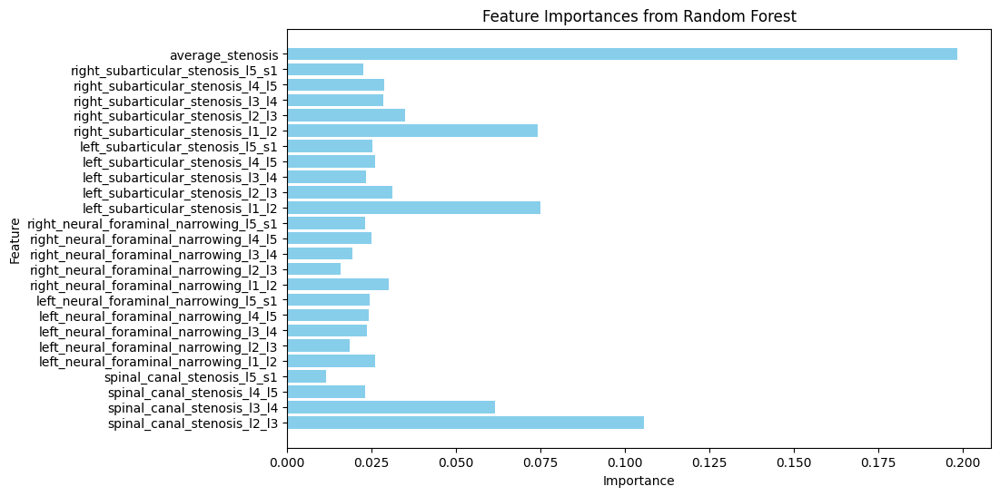

In [61]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# Load your dataset (assuming it's already loaded into df)
# Drop the 'study_id' column, as it is not a feature
X = train_df.drop(columns=['study_id', 'spinal_canal_stenosis_l1_l2'])  # Replace with the correct target column
y = train_df['spinal_canal_stenosis_l1_l2']  # Target column

# Encode the categorical target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Encode the categorical features (if any)
X_encoded = X.apply(lambda col: label_encoder.fit_transform(col) if col.dtype == 'object' else col)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y_encoded, test_size=0.2, random_state=42)

# Initialize the model
model = RandomForestClassifier()

# Fit the model to the training data
model.fit(X_train, y_train)

# Get feature importances
feature_importances = model.feature_importances_

# Print the feature importances
print("Feature Importances:", feature_importances)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importances, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances from Random Forest')
plt.show()

In [62]:
from sklearn.preprocessing import StandardScaler

# Example: Standardizing the dataset
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [63]:
from sklearn.decomposition import PCA

# Example: Applying PCA to reduce dimensions
pca = PCA(n_components=5)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [64]:
# Check for missing values
print(train_df.isnull().sum())

# Fill missing values with median (or any other suitable strategy)
train_df.fillna(train_df.median(), inplace=True)

# Detect and handle outliers using IQR
Q1 = train_df.quantile(0.25)
Q3 = train_df.quantile(0.75)
IQR = Q3 - Q1
outliers = (train_df < (Q1 - 1.5 * IQR)) | (train_df > (Q3 + 1.5 * IQR))


study_id                                  0
spinal_canal_stenosis_l1_l2               0
spinal_canal_stenosis_l2_l3               0
spinal_canal_stenosis_l3_l4               0
spinal_canal_stenosis_l4_l5               0
spinal_canal_stenosis_l5_s1               0
left_neural_foraminal_narrowing_l1_l2     0
left_neural_foraminal_narrowing_l2_l3     0
left_neural_foraminal_narrowing_l3_l4     0
left_neural_foraminal_narrowing_l4_l5     0
left_neural_foraminal_narrowing_l5_s1     0
right_neural_foraminal_narrowing_l1_l2    0
right_neural_foraminal_narrowing_l2_l3    0
right_neural_foraminal_narrowing_l3_l4    0
right_neural_foraminal_narrowing_l4_l5    0
right_neural_foraminal_narrowing_l5_s1    0
left_subarticular_stenosis_l1_l2          0
left_subarticular_stenosis_l2_l3          0
left_subarticular_stenosis_l3_l4          0
left_subarticular_stenosis_l4_l5          0
left_subarticular_stenosis_l5_s1          0
right_subarticular_stenosis_l1_l2         0
right_subarticular_stenosis_l2_l

In [65]:
from sklearn.feature_selection import SelectFromModel

# Apply label encoding to categorical columns
categorical_columns = [
    'spinal_canal_stenosis_l1_l2', 'spinal_canal_stenosis_l2_l3',
    'spinal_canal_stenosis_l3_l4', 'spinal_canal_stenosis_l4_l5',
    'spinal_canal_stenosis_l5_s1', 'left_neural_foraminal_narrowing_l1_l2',
    'left_neural_foraminal_narrowing_l2_l3', 'left_neural_foraminal_narrowing_l3_l4',
    'left_neural_foraminal_narrowing_l4_l5', 'left_neural_foraminal_narrowing_l5_s1',
    'right_neural_foraminal_narrowing_l1_l2', 'right_neural_foraminal_narrowing_l2_l3',
    'right_neural_foraminal_narrowing_l3_l4', 'right_neural_foraminal_narrowing_l4_l5',
    'right_neural_foraminal_narrowing_l5_s1', 'left_subarticular_stenosis_l1_l2',
    'left_subarticular_stenosis_l2_l3', 'left_subarticular_stenosis_l3_l4',
    'left_subarticular_stenosis_l4_l5', 'left_subarticular_stenosis_l5_s1',
    'right_subarticular_stenosis_l1_l2', 'right_subarticular_stenosis_l2_l3',
    'right_subarticular_stenosis_l3_l4', 'right_subarticular_stenosis_l4_l5',
    'right_subarticular_stenosis_l5_s1'
]

label_encoder = LabelEncoder()
for col in categorical_columns:
    train_df[col] = label_encoder.fit_transform(train_df[col])

# Feature selection using Random Forest
X = train_df.drop(['study_id'], axis=1)  # Exclude the study_id column
y = train_df['spinal_canal_stenosis_l1_l2']  # Replace with actual target column

model = RandomForestClassifier()
model.fit(X, y)

selected_features = SelectFromModel(model, threshold=0.05).fit_transform(X, y)


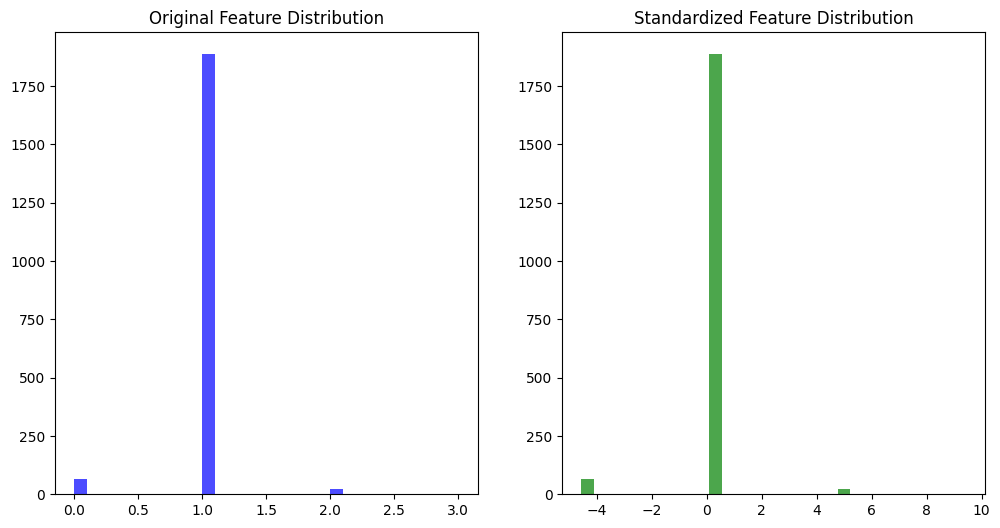

In [66]:
# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Visualize transformations
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(X['spinal_canal_stenosis_l1_l2'], bins=30, color='blue', alpha=0.7)
plt.title('Original Feature Distribution')

plt.subplot(1, 2, 2)
plt.hist(X_scaled[:, 0], bins=30, color='green', alpha=0.7)
plt.title('Standardized Feature Distribution')
plt.show()


In [67]:
# Example of feature engineering by creating a new feature
train_df['average_stenosis'] = train_df[['spinal_canal_stenosis_l1_l2',
                                         'spinal_canal_stenosis_l2_l3',
                                         'spinal_canal_stenosis_l3_l4']].mean(axis=1)


In [68]:
# Apply PCA for dimensionality reduction
pca = PCA(n_components=5)
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
print("Explained variance by principal components:", pca.explained_variance_ratio_)


Explained variance by principal components: [0.10770018 0.09078703 0.07668412 0.05748718 0.04927978]


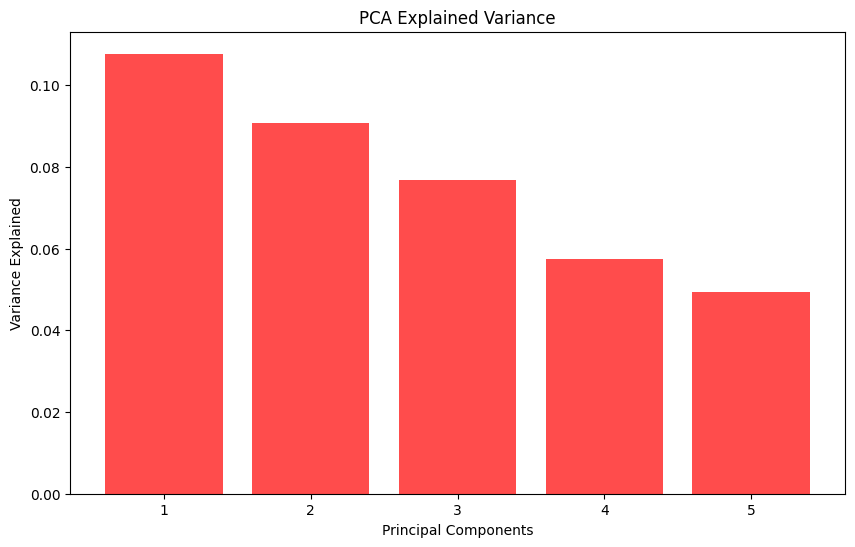

In [69]:
# Visualize PCA results
plt.figure(figsize=(10, 6))
plt.bar(range(1, 6), pca.explained_variance_ratio_, alpha=0.7, color='red')
plt.xlabel('Principal Components')
plt.ylabel('Variance Explained')
plt.title('PCA Explained Variance')
plt.show()

# Now proceed with model building using selected features and transformed data
